In [2]:
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "4"

In [3]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from joblib import load, dump
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
from torchvision import models as md
from torch import nn
from torch.nn import functional as F
import re
import math
import collections
from functools import partial
from torch.utils import model_zoo
from sklearn import metrics
from collections import Counter
import json
from efficientnet_pytorch import EfficientNet
from utils import *

In [4]:
import random

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
SEED = 2019
seed_everything(SEED)

In [5]:
current_time = get_BJ_time()
print(current_time)

0809_03-58-56


# Reading data and Basic EDA(Exploratory Data Analysis)

Here I am going to open the dataset with pandas, check distribution of labels.

In [6]:
df_2015 = pd.read_csv('../input/aptos-data-split/df_2015_raw_sigmaX30.csv')
df_2019 = pd.read_csv('../input/aptos-data-split/df_2019_sigmaX30.csv')

df = pd.concat([df_2015, df_2019]).reset_index(drop=True) # merge train val together
df['is_valid'] = [False]*df_2015.shape[0] + [True]*df_2019.shape[0]

test_df = pd.read_csv('../input/aptos2019-blindness-detection/sample_submission.csv')

In [7]:
bs = 32 #smaller batch size is better for training, but may take longer
sz = 256  # get model input size
# sz = EfficientNet.get_image_size(model_name)  # get model input size
tfms = get_transforms(do_flip=True,flip_vert=True, max_rotate=0, max_zoom=1.2, max_warp=0)

In [8]:
data = (ImageList.from_df(df=df,path='./',cols='path')
        .split_from_df("is_valid")
        .label_from_df(cols='diagnosis',label_cls=FloatList) 
        .transform(tfms,size=sz,resize_method=ResizeMethod.SQUISH,padding_mode='zeros') 
        .databunch(bs=bs,num_workers=4) 
        .normalize(imagenet_stats)  
       )
data

ImageDataBunch;

Train: LabelList (35126 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
0.0,0.0,0.0,0.0,0.0
Path: .;

Valid: LabelList (3662 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
0.0,0.0,1.0,2.0,1.0
Path: .;

Test: None

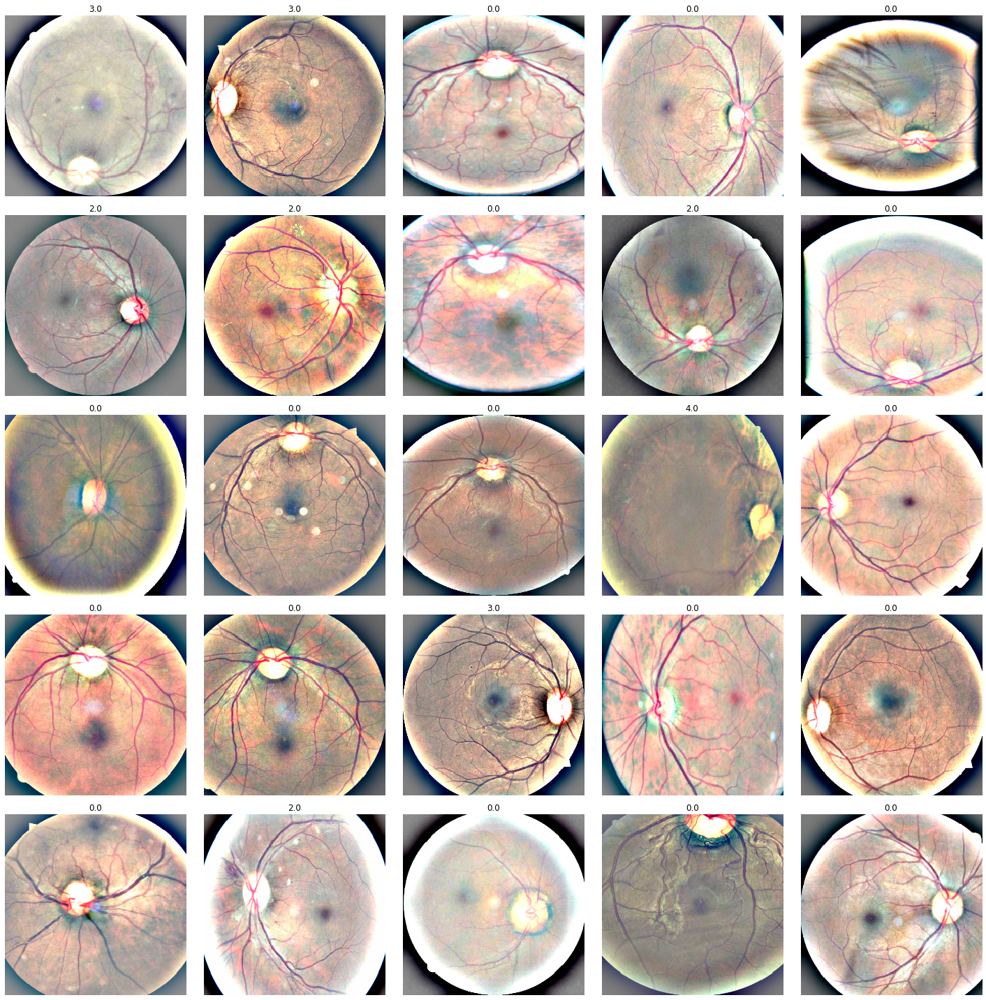

In [9]:
data.show_batch()

In [10]:
data_2019 = (ImageList.from_df(df=df_2019,path='./',cols='path')
        .split_from_df("is_valid")
        .label_from_df(cols='diagnosis',label_cls=FloatList) 
        .transform(tfms,size=sz,resize_method=ResizeMethod.SQUISH,padding_mode='zeros') 
        .databunch(bs=bs,num_workers=4) 
        .normalize(imagenet_stats)  
       )
data_2019

ImageDataBunch;

Train: LabelList (2929 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
0.0,0.0,1.0,2.0,1.0
Path: .;

Valid: LabelList (733 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
2.0,1.0,0.0,4.0,0.0
Path: .;

Test: None

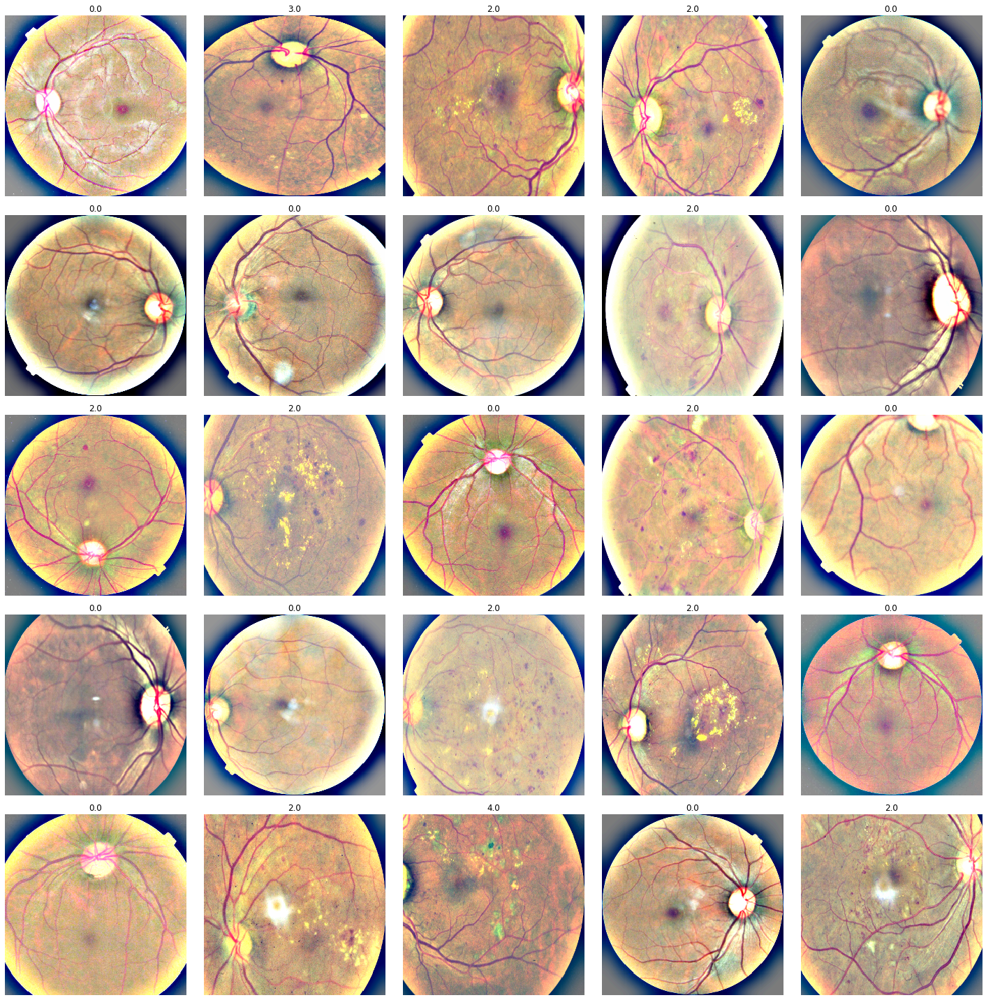

In [11]:
data_2019.show_batch()

# Training (Transfer learning)

The Kaggle competition used the Cohen's quadratically weighted kappa so I have that here to compare. This is a better metric when dealing with imbalanced datasets like this one, and for measuring inter-rater agreement for categorical classification (the raters being the human-labeled dataset and the neural network predictions). Here is an implementation based on the scikit-learn's implementation, but converted to a pytorch tensor, as that is what fastai uses.

In [12]:
def qk(y_pred, y):
    return torch.tensor(cohen_kappa_score(torch.round(y_pred), y, weights='quadratic'), device='cuda:0')

In [13]:
model_name = 'efficientnet-b3'
model = EfficientNet.from_pretrained(model_name, num_classes=1)

Loaded pretrained weights for efficientnet-b3


In [14]:
learn = Learner(data, 
                model, 
                metrics = [qk],
                callback_fns=[partial(EarlyStoppingCallback, min_delta=0, patience=3)],
                model_dir = '../output/models/')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 2.29E-06
Min loss divided by 10: 1.10E-03


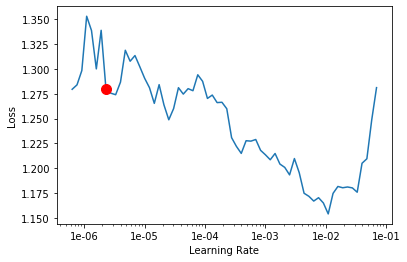

In [15]:
# Explore lr from `start_lr` to `end_lr` over `num_it` iterations in `learn`. If `stop_div`, stops when loss diverges.
learn.lr_find() 
learn.recorder.plot(suggestion=True)

In [16]:
model_save_name = "{}_{}_stage1".format(model_name, current_time)
# min_grad_lr = learn.recorder.min_grad_lr
learn.fit_one_cycle(15, 2e-4, callbacks=[SaveModelCallback(learn, every='improvement', name=model_save_name)])
print("Model save as:", model_save_name)

epoch,train_loss,valid_loss,qk,time
0,0.670274,0.606864,0.770416,04:28
1,0.500509,0.463941,0.833016,04:27
2,0.475292,0.400703,0.844830,04:27
3,0.432113,0.705122,0.791597,04:26
4,0.387120,0.530840,0.829769,04:27
5,0.374239,0.397514,0.858009,04:26
6,0.355238,0.366296,0.873960,04:27
7,0.351231,0.374713,0.877146,04:27
8,0.294938,0.370171,0.880397,04:27
9,0.295769,0.356287,0.879140,04:27


Better model found at epoch 0 with valid_loss value: 0.6068643927574158.
Better model found at epoch 1 with valid_loss value: 0.46394112706184387.
Better model found at epoch 2 with valid_loss value: 0.40070340037345886.
Better model found at epoch 5 with valid_loss value: 0.3975135385990143.
Better model found at epoch 6 with valid_loss value: 0.36629587411880493.
Better model found at epoch 9 with valid_loss value: 0.3562866151332855.
Better model found at epoch 10 with valid_loss value: 0.34014058113098145.
Epoch 14: early stopping
Model save as: efficientnet-b3_0809_03-58-56_stage1


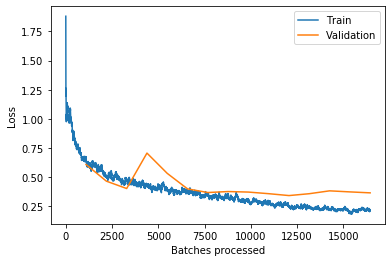

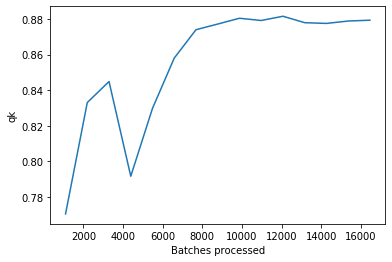

In [17]:
learn.recorder.plot_losses()
learn.recorder.plot_metrics()

In [20]:
learn = Learner(data_2019, 
                model, 
                metrics = [qk],
                callback_fns=[partial(EarlyStoppingCallback, monitor="qk", min_delta=0, patience=3)],
                model_dir = '../output/models/')

learn.data.add_test(ImageList.from_df(test_df,
                                      '../input/aptos2019-blindness-detection',
                                      folder='test_images_ben_preprocessing',
                                      suffix='.png'))

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 9.12E-07
Min loss divided by 10: 2.51E-04


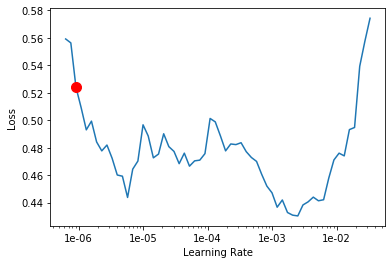

In [21]:
learn.load(model_save_name)

# Explore lr from `start_lr` to `end_lr` over `num_it` iterations in `learn`. If `stop_div`, stops when loss diverges.
learn.lr_find() 
learn.recorder.plot(suggestion=True)

In [22]:
model_save_name = "{}_{}_stage2".format(model_name, current_time)
# min_grad_lr = learn.recorder.min_grad_lr
learn.fit_one_cycle(15, 5e-6, callbacks=[SaveModelCallback(learn, every='improvement', name=model_save_name)])
print("Model save as:", model_save_name)

epoch,train_loss,valid_loss,qk,time
0,0.456847,0.372415,0.854577,00:24
1,0.467000,0.399686,0.851463,00:24
2,0.425885,0.394021,0.853588,00:24
3,0.420771,0.376116,0.854157,00:24
4,0.373111,0.355902,0.862838,00:24
5,0.365006,0.333314,0.877793,00:24
6,0.354996,0.320456,0.881925,00:24
7,0.349687,0.307683,0.885785,00:24
8,0.323172,0.298114,0.883348,00:24
9,0.317411,0.292576,0.883348,00:24


Better model found at epoch 0 with valid_loss value: 0.3724149465560913.
Better model found at epoch 4 with valid_loss value: 0.3559019863605499.
Better model found at epoch 5 with valid_loss value: 0.33331364393234253.
Better model found at epoch 6 with valid_loss value: 0.3204558193683624.
Better model found at epoch 7 with valid_loss value: 0.30768346786499023.
Better model found at epoch 8 with valid_loss value: 0.2981142997741699.
Better model found at epoch 9 with valid_loss value: 0.2925763428211212.
Better model found at epoch 10 with valid_loss value: 0.28907570242881775.
Better model found at epoch 11 with valid_loss value: 0.2858392000198364.
Better model found at epoch 13 with valid_loss value: 0.28360894322395325.
Model save as: efficientnet-b3_0809_03-58-56_stage2


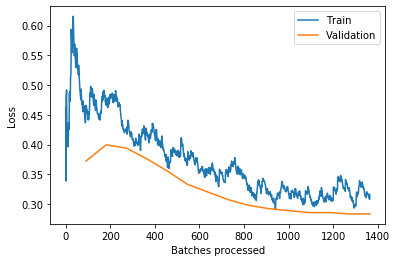

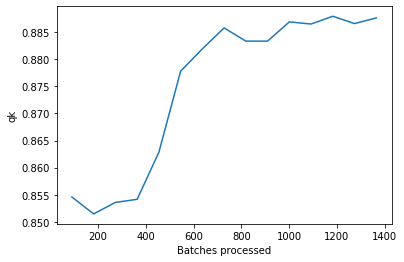

In [23]:
learn.recorder.plot_losses()
learn.recorder.plot_metrics()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.10E-06
Min loss divided by 10: 2.29E-05


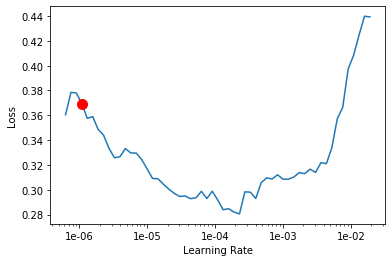

In [24]:
# Explore lr from `start_lr` to `end_lr` over `num_it` iterations in `learn`. If `stop_div`, stops when loss diverges.
learn.lr_find() 
learn.recorder.plot(suggestion=True)

In [25]:
learn.fit_one_cycle(15, 1e-5, callbacks=[SaveModelCallback(learn, every='improvement', name=model_save_name)])
print("Model save as:", model_save_name)

epoch,train_loss,valid_loss,qk,time
0,0.342808,0.285821,0.885841,00:24
1,0.320247,0.278393,0.889105,00:24
2,0.300336,0.271853,0.892197,00:24
3,0.288913,0.265995,0.897460,00:24
4,0.292308,0.255578,0.900040,00:24
5,0.285441,0.248635,0.899343,00:24
6,0.268724,0.248172,0.902579,00:24
7,0.272798,0.248188,0.903373,00:24
8,0.261468,0.241591,0.903701,00:24
9,0.259657,0.242143,0.903692,00:24


Better model found at epoch 0 with valid_loss value: 0.2858211398124695.
Better model found at epoch 1 with valid_loss value: 0.27839305996894836.
Better model found at epoch 2 with valid_loss value: 0.2718525528907776.
Better model found at epoch 3 with valid_loss value: 0.26599475741386414.
Better model found at epoch 4 with valid_loss value: 0.2555784583091736.
Better model found at epoch 5 with valid_loss value: 0.24863474071025848.
Better model found at epoch 6 with valid_loss value: 0.2481716126203537.
Better model found at epoch 8 with valid_loss value: 0.2415907382965088.
Better model found at epoch 10 with valid_loss value: 0.23986296355724335.
Better model found at epoch 11 with valid_loss value: 0.23940205574035645.
Model save as: efficientnet-b3_0809_03-58-56_stage2


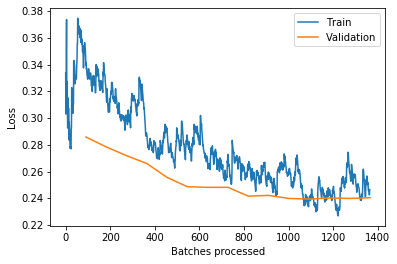

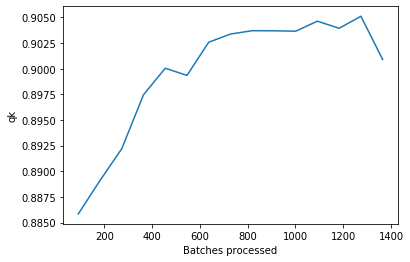

In [26]:
learn.recorder.plot_losses()
learn.recorder.plot_metrics()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
Min loss divided by 10: 4.79E-05


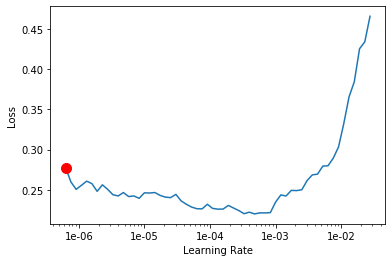

In [27]:
learn.lr_find() 
learn.recorder.plot(suggestion=True)

In [28]:
learn.fit_one_cycle(15, 4e-5, callbacks=[SaveModelCallback(learn, every='improvement', name=model_save_name)])
print("Model save as:", model_save_name)

epoch,train_loss,valid_loss,qk,time
0,0.239942,0.240157,0.903936,00:24
1,0.237922,0.238430,0.902449,00:24
2,0.233256,0.240005,0.899631,00:24
3,0.221678,0.233187,0.908231,00:24
4,0.228228,0.228222,0.914602,00:24
5,0.217104,0.233705,0.902815,00:24
6,0.193907,0.227126,0.910577,00:24
7,0.190729,0.229316,0.911660,00:24


Better model found at epoch 0 with valid_loss value: 0.24015681445598602.
Better model found at epoch 1 with valid_loss value: 0.2384301722049713.
Better model found at epoch 3 with valid_loss value: 0.2331865280866623.
Better model found at epoch 4 with valid_loss value: 0.22822214663028717.
Better model found at epoch 6 with valid_loss value: 0.22712571918964386.
Epoch 8: early stopping
Better model found at epoch 8 with valid_loss value: 0.22564853727817535.
Model save as: efficientnet-b3_0809_03-58-56_stage2


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 2.75E-06
Min loss divided by 10: 1.20E-06


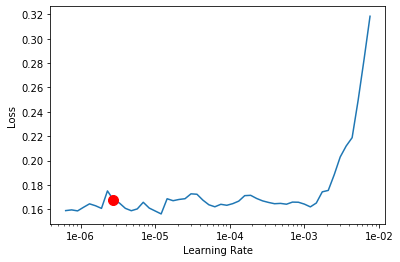

In [29]:
learn.lr_find() 
learn.recorder.plot(suggestion=True)

In [30]:
learn.fit_one_cycle(15, 1e-5, callbacks=[SaveModelCallback(learn, every='improvement', name=model_save_name)])
print("Model save as:", model_save_name)

epoch,train_loss,valid_loss,qk,time
0,0.162832,0.224471,0.910536,00:24
1,0.169727,0.224537,0.910245,00:24
2,0.174331,0.225190,0.910398,00:24
3,0.174457,0.225900,0.908996,00:24


Better model found at epoch 0 with valid_loss value: 0.22447142004966736.
Epoch 4: early stopping
Model save as: efficientnet-b3_0809_03-58-56_stage2


In [31]:
learn.load(model_save_name)

Learner(data=ImageDataBunch;

Train: LabelList (2929 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
0.0,0.0,1.0,2.0,1.0
Path: .;

Valid: LabelList (733 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
2.0,1.0,0.0,4.0,0.0
Path: .;

Test: LabelList (1928 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: EmptyLabelList
,,,,
Path: ., model=EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    3, 40, kernel_size=(3, 3), stride=(2, 2), bias=False
    (static_padding): ZeroPad2d(padding=(0, 1, 0, 1), value=0.0)
  )
  (_bn0): BatchNorm2d(40, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv): Conv2dStaticSamePadding(
        40, 40, kernel_size=(3, 3)

# Optimize the Metric
Optimizing the quadratic kappa metric was an important part of the top solutions in the previous competition. Thankfully, @abhishek has already provided code to do this for us. We will use this to improve the score.

In [32]:
import scipy as sp

In [33]:
class OptimizedRounder(object):
    """
    Optimize threshold coefficients.
    """
    def __init__(self):
        self.coef_ = 0

    def _kappa_loss(self, coef, X, y):
        """
        Customized loss function.
        
        :param coef: list, shape=[4]
            Threshold.
        :param X: list, shape=[5]
            Prediction.
        :param y: list, shape=[5]
            Golden label.
        """
        X_p = np.copy(X)
        for i, pred in enumerate(X_p):
            if pred < coef[0]:
                X_p[i] = 0
            elif pred >= coef[0] and pred < coef[1]:
                X_p[i] = 1
            elif pred >= coef[1] and pred < coef[2]:
                X_p[i] = 2
            elif pred >= coef[2] and pred < coef[3]:
                X_p[i] = 3
            else:
                X_p[i] = 4
        
        # Cohen's kappa: a statistic that measures inter-annotator agreement.
        ll = metrics.cohen_kappa_score(y, X_p, weights='quadratic')
        return -ll

    def fit(self, X, y):
        """
        :param X: list, shape=[5]
            Prediction.
        :param y: list, shape=[5]
            Golden label.
        """
        # new function with partial application of the given arguments and keywords.
        loss_partial = partial(self._kappa_loss, X=X, y=y)
        initial_coef = [0.5, 1.5, 2.5, 3.5]
        # Minimization of scalar function of one or more variables.
        self.coef_ = sp.optimize.minimize(loss_partial, initial_coef, method='nelder-mead')
        print(-loss_partial(self.coef_['x']))

    def predict(self, X, coef):
        """
        :param X: list, shape=[5]
            Prediction.
        :param coef: list, shape=[4]
            Threshold.
        """
        X_p = np.copy(X)
        for i, pred in enumerate(X_p):
            if pred < coef[0]:
                X_p[i] = 0
            elif pred >= coef[0] and pred < coef[1]:
                X_p[i] = 1
            elif pred >= coef[1] and pred < coef[2]:
                X_p[i] = 2
            elif pred >= coef[2] and pred < coef[3]:
                X_p[i] = 3
            else:
                X_p[i] = 4
        return X_p

    def coefficients(self):
        return self.coef_['x']

In [34]:
# Return predictions and targets on `ds_type` dataset.
valid_preds = learn.get_preds(ds_type=DatasetType.Valid)
optR = OptimizedRounder()
optR.fit(valid_preds[0],valid_preds[1])
coefficients = optR.coefficients()
print(coefficients)

0.9217287074499815
[0.530727 1.540145 2.343896 3.435698]


# Error Analysis

In [35]:
valid_pred = optR.predict(valid_preds[0], [0.5, 1.5, 2.5, 3.5])
cm = confusion_matrix(valid_pred,valid_preds[1])

Confusion matrix, without normalization
[[357   4   0   0   0]
 [  9  30  13   0   2]
 [  0  33 165   4  15]
 [  0   1  27  23  21]
 [  0   0   1   3  25]]


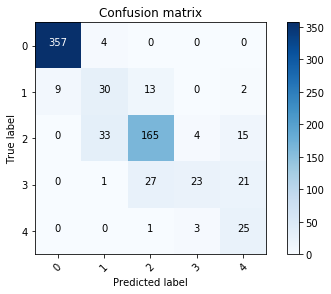

In [36]:
plot_confusion_matrix(cm, classes=range(5), normalize=False)

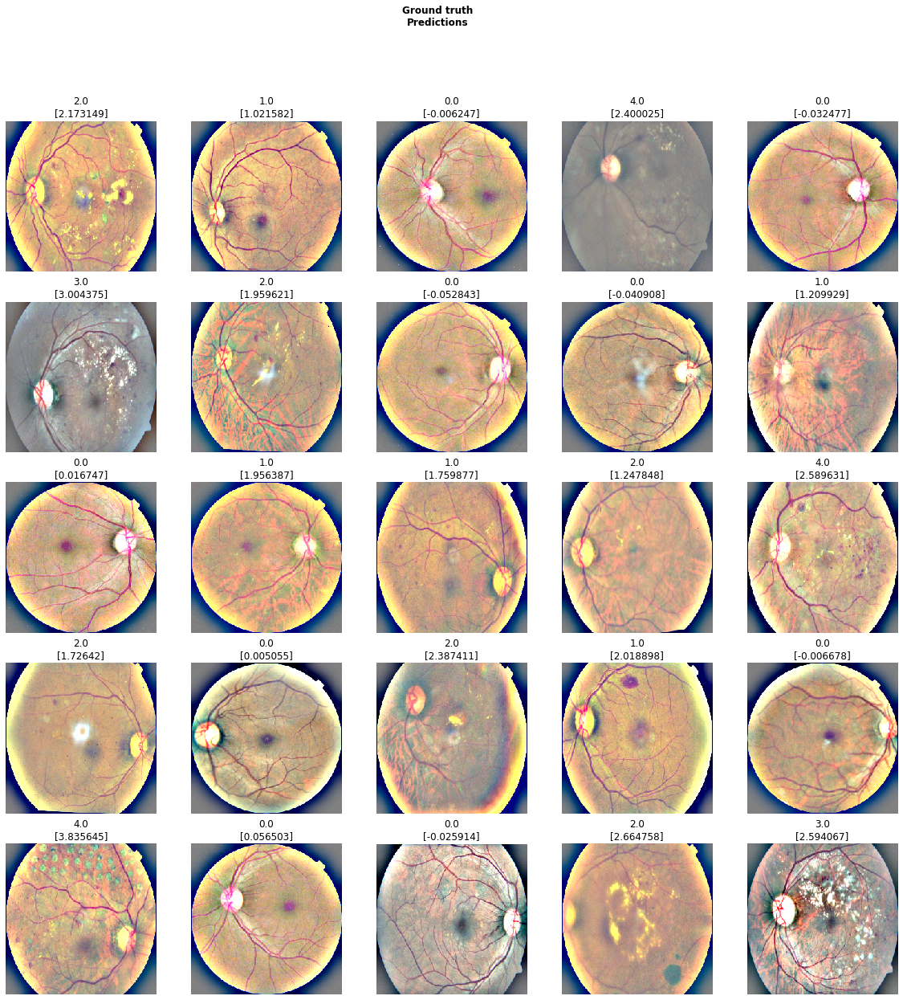

In [37]:
learn.show_results()

# Submission

In [38]:
preds,y = learn.get_preds(DatasetType.Test)
tst_pred = optR.predict(preds, coefficients)
test_df.diagnosis = tst_pred.astype(int)

In [43]:
save_filename = '{}_submition.csv'.format(model_save_name)
test_df.to_csv(save_filename,index=False)
print (save_filename, 'done')

efficientnet-b3_0809_03-58-56_stage2_submition.csv done


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fade3eb0a20>]], dtype=object)

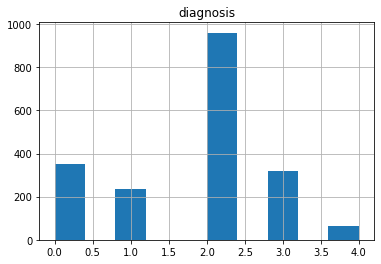

In [40]:
test_df.hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fade3bc3080>]], dtype=object)

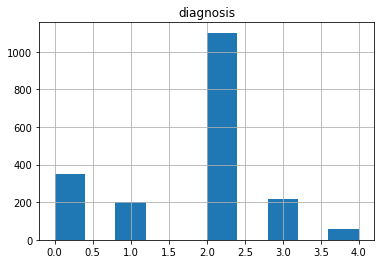

In [41]:
test_df.diagnosis = optR.predict(preds, [0.5, 1.5, 2.5, 3.5])
test_df.hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fade3c31278>]], dtype=object)

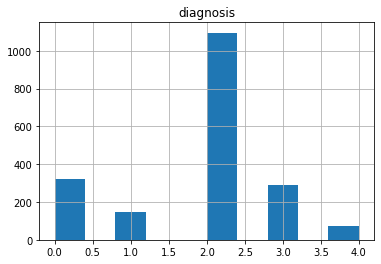

In [42]:
pd.read_csv("0.786.csv").hist()